In [1]:
import os
import sys
import glob
import numpy as np
import pandas as pd
import random
import math
import gc
import cv2
from tqdm import tqdm
import time
from functools import lru_cache
import torch
from torch import nn
from torch.nn import functional as F
from torch.utils.data import Dataset, DataLoader
from torch.cuda.amp import autocast, GradScaler
import timm
import albumentations as A
from albumentations.pytorch import ToTensorV2
import matplotlib.pyplot as plt
from sklearn.metrics import matthews_corrcoef

/opt/conda/lib/python3.10/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
DATA_PATH = "../data"
DATA_PROCESSED_PATH = "../data/processed"
pd.set_option('display.max_columns', None)

test_helmets = pd.read_csv(os.path.join(DATA_PATH, "test_baseline_helmets.csv"))
test_tracking = pd.read_csv(os.path.join(DATA_PATH, "test_player_tracking.csv"))
test_video_metadata = pd.read_csv(os.path.join(DATA_PATH, "test_video_metadata.csv"))

In [3]:
def expand_contact_id(df):
    """
    Splits out contact_id into seperate columns.
    """
    df["game_play"] = df["contact_id"].str[:12]
    df["step"] = df["contact_id"].str.split("_").str[-3].astype("int")
    df["nfl_player_id_1"] = df["contact_id"].str.split("_").str[-2]
    df["nfl_player_id_2"] = df["contact_id"].str.split("_").str[-1]
    return df

labels = expand_contact_id(pd.read_csv(os.path.join(DATA_PATH, "sample_submission.csv")))
labels

,contact_id,contact,game_play,step,nfl_player_id_1,nfl_player_id_2
0,58168_003392_0_38590_43854,0,58168_003392,0,38590,43854
1,58168_003392_0_38590_41257,0,58168_003392,0,38590,41257
2,58168_003392_0_38590_41944,0,58168_003392,0,38590,41944
3,58168_003392_0_38590_42386,0,58168_003392,0,38590,42386
4,58168_003392_0_38590_47944,0,58168_003392,0,38590,47944
...,...,...,...,...,...,...
49583,58172_003247_125_40656_G,0,58172_003247,125,40656,G
49584,58172_003247_125_52521_G,0,58172_003247,125,52521,G
49585,58172_003247_125_52939_G,0,58172_003247,125,52939,G
49586,58172_003247_125_39008_G,0,58172_003247,125,39008,G


In [4]:
pd.read_csv(os.path.join(DATA_PATH, "sample_submission.csv"))

,contact_id,contact
0,58168_003392_0_38590_43854,0
1,58168_003392_0_38590_41257,0
2,58168_003392_0_38590_41944,0
3,58168_003392_0_38590_42386,0
4,58168_003392_0_38590_47944,0
...,...,...
49583,58172_003247_125_40656_G,0
49584,58172_003247_125_52521_G,0
49585,58172_003247_125_52939_G,0
49586,58172_003247_125_39008_G,0


In [5]:
def create_features(df, tr_tracking, merge_col="step", use_cols=["x_position", "y_position"]):
    output_cols = []
    df_combo = (
        df.astype({"nfl_player_id_1": "str"})
        .merge(
            tr_tracking.astype({"nfl_player_id": "str"})[
                ["game_play", merge_col, "nfl_player_id",] + use_cols
            ],
            left_on=["game_play", merge_col, "nfl_player_id_1"],
            right_on=["game_play", merge_col, "nfl_player_id"],
            how="left",
        )
        .rename(columns={c: c+"_1" for c in use_cols})
        .drop("nfl_player_id", axis=1)
        .merge(
            tr_tracking.astype({"nfl_player_id": "str"})[
                ["game_play", merge_col, "nfl_player_id"] + use_cols
            ],
            left_on=["game_play", merge_col, "nfl_player_id_2"],
            right_on=["game_play", merge_col, "nfl_player_id"],
            how="left",
        )
        .drop("nfl_player_id", axis=1)
        .rename(columns={c: c+"_2" for c in use_cols})
        .sort_values(["game_play", merge_col, "nfl_player_id_1", "nfl_player_id_2"])
        .reset_index(drop=True)
    )
    output_cols += [c+"_1" for c in use_cols]
    output_cols += [c+"_2" for c in use_cols]
    
    if ("x_position" in use_cols) & ("y_position" in use_cols):
        index = df_combo['x_position_2'].notnull()
        
        distance_arr = np.full(len(index), np.nan)
        tmp_distance_arr = np.sqrt(
            np.square(df_combo.loc[index, "x_position_1"] - df_combo.loc[index, "x_position_2"])
            + np.square(df_combo.loc[index, "y_position_1"]- df_combo.loc[index, "y_position_2"])
        )
        
        distance_arr[index] = tmp_distance_arr
        df_combo['distance'] = distance_arr
        output_cols += ["distance"]
        
    df_combo['G_flug'] = (df_combo['nfl_player_id_2']=="G")
    output_cols += ["G_flug"]
    return df_combo, output_cols




In [6]:
use_cols = [
    'x_position', 'y_position', 'speed', 'distance',
    'direction', 'orientation', 'acceleration', 'sa'
]

test, feature_cols = create_features(labels, test_tracking, use_cols=use_cols)
test

,contact_id,contact,game_play,step,nfl_player_id_1,nfl_player_id_2,x_position_1,y_position_1,speed_1,distance_1,direction_1,orientation_1,acceleration_1,sa_1,x_position_2,y_position_2,speed_2,distance_2,direction_2,orientation_2,acceleration_2,sa_2,distance,G_flug
0,58168_003392_0_37084_37211,0,58168_003392,0,37084,37211,41.90,20.08,0.54,0.06,252.69,262.31,0.92,0.90,39.59,17.07,0.53,0.05,134.84,84.73,1.43,1.42,3.794232,False
1,58168_003392_0_37084_38556,0,58168_003392,0,37084,38556,41.90,20.08,0.54,0.06,252.69,262.31,0.92,0.90,41.93,30.61,0.67,0.05,232.50,227.00,1.82,1.61,10.530043,False
2,58168_003392_0_37084_38567,0,58168_003392,0,37084,38567,41.90,20.08,0.54,0.06,252.69,262.31,0.92,0.90,40.37,19.88,0.66,0.07,136.70,88.92,0.90,0.89,1.543017,False
3,58168_003392_0_37084_38590,0,58168_003392,0,37084,38590,41.90,20.08,0.54,0.06,252.69,262.31,0.92,0.90,40.33,25.28,0.52,0.06,141.08,100.37,0.59,0.58,5.431841,False
4,58168_003392_0_37084_39947,0,58168_003392,0,37084,39947,41.90,20.08,0.54,0.06,252.69,262.31,0.92,0.90,40.11,26.73,0.99,0.09,163.38,90.69,1.68,1.64,6.886697,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49583,58172_003247_125_52521_52939,0,58172_003247,125,52521,52939,23.44,4.04,1.41,0.15,163.22,185.42,0.75,-0.58,37.94,2.10,2.29,0.24,211.73,215.11,2.43,-2.43,14.629204,False
49584,58172_003247_125_52521_G,0,58172_003247,125,52521,G,23.44,4.04,1.41,0.15,163.22,185.42,0.75,-0.58,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,True
49585,58172_003247_125_52852_52939,0,58172_003247,125,52852,52939,32.67,2.18,2.34,0.24,113.19,119.09,1.03,-0.97,37.94,2.10,2.29,0.24,211.73,215.11,2.43,-2.43,5.270607,False
49586,58172_003247_125_52852_G,0,58172_003247,125,52852,G,32.67,2.18,2.34,0.24,113.19,119.09,1.03,-0.97,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,True


In [7]:
test_filtered = test.query('not distance>2').reset_index(drop=True)
test_filtered['frame'] = (test_filtered['step']/10*59.94+5*59.94).astype('int')+1
test_filtered

,contact_id,contact,game_play,step,nfl_player_id_1,nfl_player_id_2,x_position_1,y_position_1,speed_1,distance_1,direction_1,orientation_1,acceleration_1,sa_1,x_position_2,y_position_2,speed_2,distance_2,direction_2,orientation_2,acceleration_2,sa_2,distance,G_flug,frame
0,58168_003392_0_37084_38567,0,58168_003392,0,37084,38567,41.90,20.08,0.54,0.06,252.69,262.31,0.92,0.90,40.37,19.88,0.66,0.07,136.70,88.92,0.90,0.89,1.543017,False,300
1,58168_003392_0_37084_G,0,58168_003392,0,37084,G,41.90,20.08,0.54,0.06,252.69,262.31,0.92,0.90,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,True,300
2,58168_003392_0_37211_46445,0,58168_003392,0,37211,46445,39.59,17.07,0.53,0.05,134.84,84.73,1.43,1.42,40.34,18.08,1.10,0.10,148.93,92.39,2.03,2.03,1.258014,False,300
3,58168_003392_0_37211_G,0,58168_003392,0,37211,G,39.59,17.07,0.53,0.05,134.84,84.73,1.43,1.42,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,True,300
4,58168_003392_0_38556_G,0,58168_003392,0,38556,G,41.93,30.61,0.67,0.05,232.50,227.00,1.82,1.61,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,True,300
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6626,58172_003247_125_48241_G,0,58172_003247,125,48241,G,33.86,-1.28,0.79,0.08,148.92,130.02,1.40,-0.06,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,True,1049
6627,58172_003247_125_48335_G,0,58172_003247,125,48335,G,44.74,3.16,4.72,0.48,247.51,255.55,1.34,-1.08,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,True,1049
6628,58172_003247_125_52521_G,0,58172_003247,125,52521,G,23.44,4.04,1.41,0.15,163.22,185.42,0.75,-0.58,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,True,1049
6629,58172_003247_125_52852_G,0,58172_003247,125,52852,G,32.67,2.18,2.34,0.24,113.19,119.09,1.03,-0.97,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,True,1049


In [8]:
feature_cols

['x_position_1',
 'y_position_1',
 'speed_1',
 'distance_1',
 'direction_1',
 'orientation_1',
 'acceleration_1',
 'sa_1',
 'x_position_2',
 'y_position_2',
 'speed_2',
 'distance_2',
 'direction_2',
 'orientation_2',
 'acceleration_2',
 'sa_2',
 'distance',
 'G_flug']

In [9]:
game_play_list = test_filtered.groupby("game_play")["game_play"].first().to_numpy()

game_play_list = game_play_list[:1]
type(game_play_list), game_play_list


(numpy.ndarray, array(['58168_003392'], dtype=object))

In [10]:
from torch.utils.data import random_split
a, b = random_split(game_play_list, [0.5, 0.5])

/opt/conda/lib/python3.10/site-packages/torch/utils/data/dataset.py:342: UserWarning: Length of split at index 1 is 0. This might result in an empty dataset.
  warnings.warn(f"Length of split at index {i} is 0. "


In [11]:
a_l = game_play_list[a.indices]
a_l

array(['58168_003392'], dtype=object)

In [12]:
test_filtered[test_filtered["game_play"].isin(a_l)]

,contact_id,contact,game_play,step,nfl_player_id_1,nfl_player_id_2,x_position_1,y_position_1,speed_1,distance_1,direction_1,orientation_1,acceleration_1,sa_1,x_position_2,y_position_2,speed_2,distance_2,direction_2,orientation_2,acceleration_2,sa_2,distance,G_flug,frame
0,58168_003392_0_37084_38567,0,58168_003392,0,37084,38567,41.90,20.08,0.54,0.06,252.69,262.31,0.92,0.90,40.37,19.88,0.66,0.07,136.70,88.92,0.90,0.89,1.543017,False,300
1,58168_003392_0_37084_G,0,58168_003392,0,37084,G,41.90,20.08,0.54,0.06,252.69,262.31,0.92,0.90,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,True,300
2,58168_003392_0_37211_46445,0,58168_003392,0,37211,46445,39.59,17.07,0.53,0.05,134.84,84.73,1.43,1.42,40.34,18.08,1.10,0.10,148.93,92.39,2.03,2.03,1.258014,False,300
3,58168_003392_0_37211_G,0,58168_003392,0,37211,G,39.59,17.07,0.53,0.05,134.84,84.73,1.43,1.42,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,True,300
4,58168_003392_0_38556_G,0,58168_003392,0,38556,G,41.93,30.61,0.67,0.05,232.50,227.00,1.82,1.61,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,True,300
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2550,58168_003392_69_46522_47837,0,58168_003392,69,46522,47837,49.46,15.97,2.19,0.22,231.10,223.64,1.17,-0.36,51.41,16.22,1.38,0.14,224.00,225.53,1.88,-0.39,1.965960,False,714
2551,58168_003392_69_46522_G,0,58168_003392,69,46522,G,49.46,15.97,2.19,0.22,231.10,223.64,1.17,-0.36,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,True,714
2552,58168_003392_69_47837_G,0,58168_003392,69,47837,G,51.41,16.22,1.38,0.14,224.00,225.53,1.88,-0.39,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,True,714
2553,58168_003392_69_47944_G,0,58168_003392,69,47944,G,40.71,11.45,0.46,0.05,48.43,94.57,0.70,0.62,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,True,714


In [13]:
test_filtered_a = test_filtered.where(test_filtered["game_play"] == )

SyntaxError: invalid syntax (4149975652.py, line 1)

In [53]:
train_aug = A.Compose([
    A.HorizontalFlip(p=0.5),
    A.ShiftScaleRotate(p=0.5, rotate_limit=10),
    A.RandomBrightnessContrast(brightness_limit=(-0.1, 0.1), contrast_limit=(-0.1, 0.1), p=0.5),
    A.Normalize(mean=[0.], std=[1.]),
    ToTensorV2()
])

valid_aug = A.Compose([
    A.Normalize(mean=[0.], std=[1.]),
    ToTensorV2()
])

In [24]:
valid_aug

Compose([
  Normalize(always_apply=False, p=1.0, mean=[0.0], std=[1.0], max_pixel_value=255.0),
  ToTensorV2(always_apply=True, p=1.0, transpose_mask=False),
], p=1.0, bbox_params=None, keypoint_params=None, additional_targets={})

In [25]:
video2helmets = {}
test_helmets_new = test_helmets.set_index('video')
for video in tqdm(test_helmets.video.unique()):
    video2helmets[video] = test_helmets_new.loc[video].reset_index(drop=True)

100%|██████████| 4/4 [00:00<00:00, 500.04it/s]


In [16]:
video2helmets

{'58168_003392_Endzone.mp4':          game_play  game_key  play_id     view  frame  nfl_player_id  \
 0     58168_003392     58168     3392  Endzone    290          39947   
 1     58168_003392     58168     3392  Endzone    290          37211   
 2     58168_003392     58168     3392  Endzone    290          38590   
 3     58168_003392     58168     3392  Endzone    290          44822   
 4     58168_003392     58168     3392  Endzone    290          41944   
 ...            ...       ...      ...      ...    ...            ...   
 7069  58168_003392     58168     3392  Endzone    709          41257   
 7070  58168_003392     58168     3392  Endzone    709          43395   
 7071  58168_003392     58168     3392  Endzone    709          37211   
 7072  58168_003392     58168     3392  Endzone    709          46445   
 7073  58168_003392     58168     3392  Endzone    709          42386   
 
      player_label  left  width  top  height  
 0             H72   946     25  293      34  


In [17]:
video2frames = {}

for game_play in tqdm(test_video_metadata.game_play.unique()):
    for view in ['Endzone', 'Sideline']:
        video = game_play + f'_{view}.mp4'
        video2frames[video] = max(list(map(
            lambda x:int(x.split('_')[-1].split('.')[0]), 
                                           glob.glob(os.path.join(DATA_PROCESSED_PATH, f'frames/{video}*')
                                                    ))))

100%|██████████| 2/2 [00:00<00:00,  2.27it/s]


In [18]:
video2frames

{'58168_003392_Endzone.mp4': 711,
 '58168_003392_Sideline.mp4': 711,
 '58172_003247_Endzone.mp4': 1084,
 '58172_003247_Sideline.mp4': 1084}

In [19]:
test_video_metadata

,game_play,game_key,play_id,view,start_time,end_time,snap_time
0,58168_003392,58168,3392,Endzone,2020-09-11T03:01:43.134Z,2020-09-11T03:01:54.971Z,2020-09-11T03:01:48.134Z
1,58168_003392,58168,3392,Sideline,2020-09-11T03:01:43.134Z,2020-09-11T03:01:54.971Z,2020-09-11T03:01:48.134Z
2,58172_003247,58172,3247,Endzone,2020-09-13T19:30:42.414Z,2020-09-13T19:31:00.524Z,2020-09-13T19:30:47.414Z
3,58172_003247,58172,3247,Sideline,2020-09-13T19:30:42.414Z,2020-09-13T19:31:00.524Z,2020-09-13T19:30:47.414Z


In [100]:
def get_aug_img_keys():
    num_imgs = 26
    aug_img_keys = [f"image{i}" for i in range(num_imgs)]
    aug_img_keys[0] = "image"
    return aug_img_keys
aug_img_keys = get_aug_img_keys()

In [120]:
class MyDataset(Dataset):
    def __init__(self, df, aug=valid_aug, mode='train'):
        self.df = df
        self.frame = df.frame.values
        self.feature = df[feature_cols].fillna(-1).values
        self.players = df[['nfl_player_id_1','nfl_player_id_2']].values
        self.game_play = df.game_play.values
        self.aug = aug
        self.mode = mode
        self.aug_img_keys = get_aug_img_keys()
        
    def __len__(self):
        return len(self.df)
    
    # @lru_cache(1024)
    # def read_img(self, path):
    #     return cv2.imread(path, 0)
   
    def __getitem__(self, idx):   
        window = 24
        frame = self.frame[idx]
        
        if self.mode == 'train':
            frame = frame + random.randint(-6, 6)

        players = []
        for p in self.players[idx]:
            if p == 'G':
                players.append(p)
            else:
                players.append(int(p))
        
        imgs = []
        for view in ['Endzone', 'Sideline']:
            video = self.game_play[idx] + f'_{view}.mp4'

            tmp = video2helmets[video]
#             tmp = tmp.query('@frame-@window<=frame<=@frame+@window')
            tmp[tmp['frame'].between(frame-window, frame+window)]
            tmp = tmp[tmp.nfl_player_id.isin(players)]#.sort_values(['nfl_player_id', 'frame'])
            tmp_frames = tmp.frame.values
            tmp = tmp.groupby('frame')[['left','width','top','height']].mean()
#0.002s

            bboxes = []
            for f in range(frame-window, frame+window+1, 1):
                if f in tmp_frames:
                    x, w, y, h = tmp.loc[f][['left','width','top','height']]
                    bboxes.append([x, w, y, h])
                else:
                    bboxes.append([np.nan, np.nan, np.nan, np.nan])
            bboxes = pd.DataFrame(bboxes).interpolate(limit_direction='both').values
            bboxes = bboxes[::4]

            if bboxes.sum() > 0:
                flag = 1
            else:
                flag = 0
#0.03s
                    
            for i, f in enumerate(range(frame-window, frame+window+1, 4)):
                img_new = np.zeros((256, 256), dtype=np.float32)

                if flag == 1 and f <= video2frames[video]:
                    img = cv2.imread(os.path.join(DATA_PROCESSED_PATH, f'frames/{video}_{f:04d}.jpg'), 0)
                    # print(img.shape)
                    # print(img[0][0])
                    x, w, y, h = bboxes[i]

                    img = img[int(y+h/2)-128:int(y+h/2)+128,int(x+w/2)-128:int(x+w/2)+128].copy()
                    img_new[:img.shape[0], :img.shape[1]] = img
                    
                imgs.append(img_new) 
#0.06s
                
        feature = np.float32(self.feature[idx])

        img = np.array(imgs).transpose(1, 2, 0)  
        img = self.aug(image=img)["image"]
        # img = torch.tensor(aug_output_list)
        label = np.float32(self.df.contact.values[idx])

        return img, feature, label

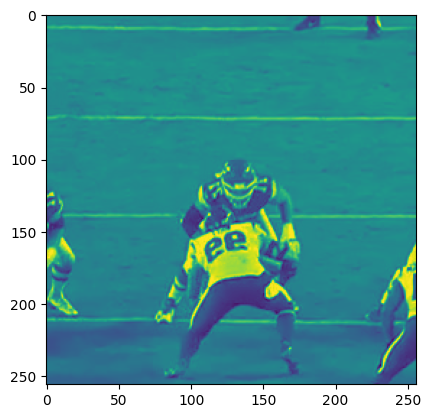

(torch.Size([26, 256, 256]),
 array([4.1900002e+01, 2.0080000e+01, 5.4000002e-01, 5.9999999e-02,
        2.5269000e+02, 2.6231000e+02, 9.2000002e-01, 8.9999998e-01,
        4.0369999e+01, 1.9879999e+01, 6.6000003e-01, 7.0000000e-02,
        1.3670000e+02, 8.8919998e+01, 8.9999998e-01, 8.8999999e-01,
        1.5430166e+00, 0.0000000e+00], dtype=float32),
 0.0)

In [121]:
img, feature, label = MyDataset(test_filtered, train_aug, 'test')[0]
plt.imshow(img.permute(1,2,0)[:,:,7])
plt.show()
img.shape, feature, label

In [111]:
def get_aug_img_keys():
    num_imgs = 26
    aug_img_keys = [f"image{i}" for i in range(num_imgs)]
    aug_img_keys[0] = "image"
    return aug_img_keys
aug_img_keys = get_aug_img_keys()

In [122]:
aug0 = A.Compose([
    A.ToFloat(max_value=255),
    A.HorizontalFlip(p=0.5),
    A.ShiftScaleRotate(p=0.5, rotate_limit=5),
    A.RandomBrightnessContrast(brightness_limit=(-0.1, 0.1), contrast_limit=(-0.1, 0.1), p=0.5),
    A.Normalize(mean=[0.], std=[1.]),
    ToTensorV2()
])


additional_targets={k:"image" for k in aug_img_keys}
aug1 = A.Compose([
    A.ToFloat(max_value=255),
    A.HorizontalFlip(p=0.5),
    A.ShiftScaleRotate(p=0.5, rotate_limit=5),
    A.RandomBrightnessContrast(brightness_limit=(-0.1, 0.1), contrast_limit=(-0.1, 0.1), p=0.5),
    A.Normalize(mean=[0.], std=[1.]),
    ToTensorV2()
], additional_targets=additional_targets)

aug2 = A.Compose([
    A.Normalize(),
    ToTensorV2()
], additional_targets=additional_targets)

aug3 = A.Compose([
    ToTensorV2()
])

aug4 = A.Compose([
    A.ToFloat(max_value=255),
    ToTensorV2()
])

torch.Size([26, 256, 256])


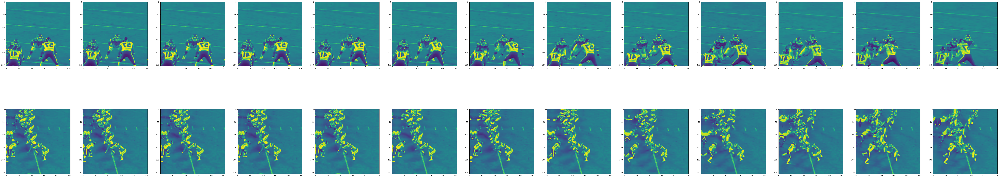

In [124]:
img, feature, label = MyDataset(test_filtered, aug0, 'test')[3]
print(img.shape)
num_imgs = int(img.size()[0]/2)
f, axarr = plt.subplots(2, num_imgs, figsize=(100,20))
for i in range(num_imgs):
    axarr[0,i].imshow(img[i])
    axarr[1,i].imshow(img[num_imgs+i])
plt.show()
# img[0]

tensor([[0.5020, 0.5059, 0.5059,  ..., 0.4667, 0.4549, 0.4549],
        [0.5098, 0.5059, 0.5059,  ..., 0.4784, 0.4706, 0.4667],
        [0.5176, 0.5098, 0.5059,  ..., 0.4863, 0.4784, 0.4745],
        ...,
        [0.1294, 0.1255, 0.1255,  ..., 0.3922, 0.3922, 0.3922],
        [0.1137, 0.1137, 0.1098,  ..., 0.4078, 0.4078, 0.4078],
        [0.1490, 0.1333, 0.1294,  ..., 0.4157, 0.4157, 0.4157]])

In [30]:
ds = MyDataset(test_filtered, valid_aug, 'test')
dl = DataLoader(ds, batch_size=32)

torch.Size([32, 26, 256, 256])
torch.Size([32, 13, 256, 256]) torch.Size([32, 13, 256, 256])


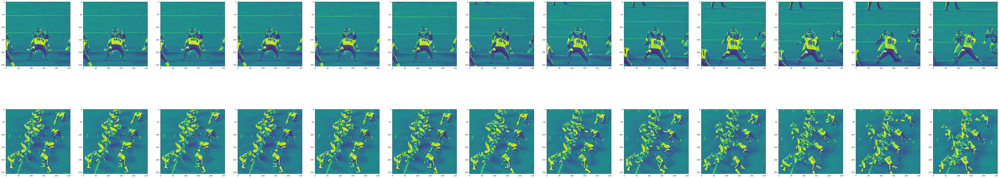

In [50]:
for d in dl:
    imgs, feature, label = d
    print(imgs.size())
    imgs1, imgs2 = torch.split(imgs, 13, dim=1)
    print(imgs1.size(), imgs2.size())
    img1, img2 = imgs1[0], imgs2[0]

    num_imgs = int(img1.size()[0])
    f, axarr = plt.subplots(2, num_imgs, figsize=(100,20))
    for i in range(num_imgs):
        axarr[0,i].imshow(img1[i])  # end
        axarr[1,i].imshow(img2[i])  # side
    plt.show()
    break